In [1]:
import os
import scanpy as sc
import numpy as np
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.linalg import eigh
import matplotlib as mpl

In [2]:
figpath = '/stanley/WangLab/kamal/figures/projects/manifesto/celltypes_tonsil/'
os.makedirs(figpath, exist_ok=True)
dpi = 500

# Load

In [3]:
adata = sc.read_h5ad('/stanley/WangLab/kamal/data/technologies/xenium/tonsil_fh/filtered/adata_juxtacrine.h5ad')

In [4]:
adata

AnnData object with n_obs × n_vars = 1349474 × 377
    obs: 'transcript_counts', 'n_counts'
    uns: 'log1p'
    obsm: 'spatial'
    layers: 'juxtacrine'

In [5]:
adata.X.max()

3.9318256327243257

In [6]:
adata.X.min()

0.0

In [7]:
filter_key = 'celltyping'
max_mag = 2

# Add layer for non-filtered data
adata.layers[filter_key] = adata.X

# Scale
sc.pp.scale(adata, layer=filter_key)

In [8]:
# Set figure size
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
set_width = 10
fignorm = set_width / width
sc.set_figure_params(figsize=(set_width, height*fignorm))
figsize=(set_width, height*fignorm)

# Clustering

In [9]:
n_pcs = 10
pca = PCA(n_components=n_pcs, random_state=0)
adata.obsm[f'X_pca_{filter_key}'] = pca.fit_transform(adata.layers[filter_key])
adata.varm[f'X_pca_{filter_key}'] = pca.components_.T

In [11]:
sc.pp.neighbors(adata, use_rep=f'X_pca_{filter_key}')

In [32]:
# sc.tl.leiden(adata, resolution=0.1, key_added='celltype', flavor='igraph', n_iterations=2, random_state=0)
# sc.tl.leiden(adata, resolution=0.25, key_added='celltype', flavor='leidenalg', random_state=0, n_iterations=2) # lil baby stuff maybe ok
sc.tl.leiden(adata, resolution=0.3, key_added='celltype', flavor='leidenalg', random_state=0, n_iterations=2)

## Plot markers

In [33]:
sc.tl.rank_genes_groups(adata, groupby='celltype', layer=filter_key)
sc.tl.dendrogram(adata, groupby='celltype', use_rep=f'X_pca_{filter_key}')

/home/unix/kmaher/.local/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/unix/kmaher/.local/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/unix/kmaher/.local/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/unix/kmaher/.local/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/unix/kmaher/.local/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/unix/kmah

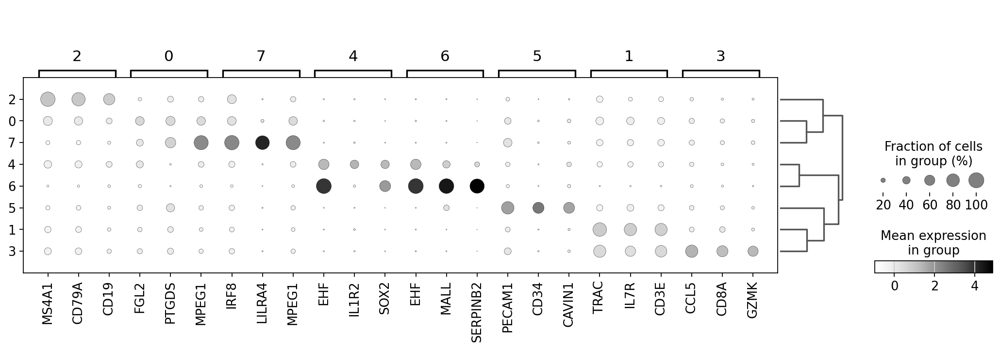

In [34]:
fig = plt.figure(figsize=(16,4.5))
ax = plt.gca()
sc.pl.rank_genes_groups_dotplot(adata, groupby='celltype', n_genes=3, layer=filter_key, ax=ax, cmap='Greys')
figname = 'celltype_markers.png'
savepath = os.path.join(figpath, figname)
fig.savefig(savepath, dpi=dpi, bbox_inches='tight')

## Plot tissue

In [35]:
palette = sc.pl.palettes.default_102

celltype2color = {
    '0': palette[3], # Dendritic 1
    '1': palette[0], # T-cell 1
    '2': palette[1], # B-cell
    '3': palette[5], # T-cell 2
    '4': palette[2], # Hyper 1
    '5': palette[6], # Vasc
    '6': palette[4], # Hyper 2
    '7': palette[7], # Dendritic 2
}

adata.obs['celltype_colors'] = adata.obs['celltype'].map(celltype2color)

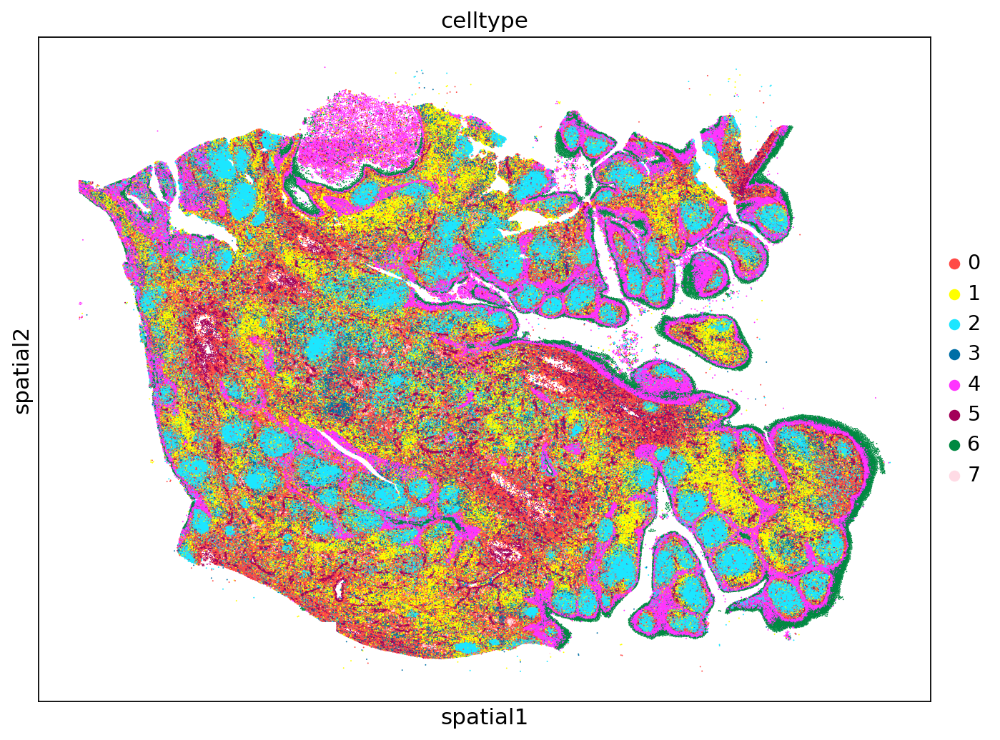

In [37]:
sc.pl.embedding(
    adata,
    basis='spatial',
    color='celltype',
    palette=celltype2color,
    s=3,
)

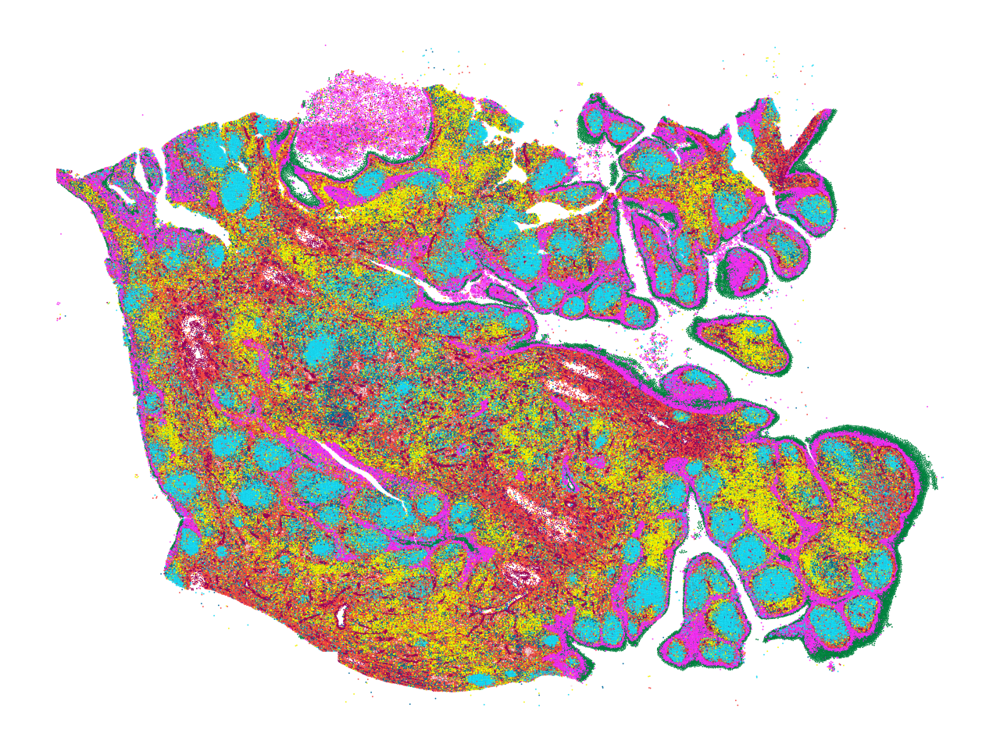

In [37]:
points = adata.obsm['spatial']
plt.figure(figsize=figsize)
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=0.6,
    c=adata.obs['celltype_colors'],
)
plt.axis('off')
filename = os.path.join(figpath, f'celltypes.png')
plt.savefig(filename, dpi=dpi)
plt.show()

# Zoom 1

In [38]:
# Set zoom dims
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
zoom_width = height/9
zoom_height = zoom_width * 0.6

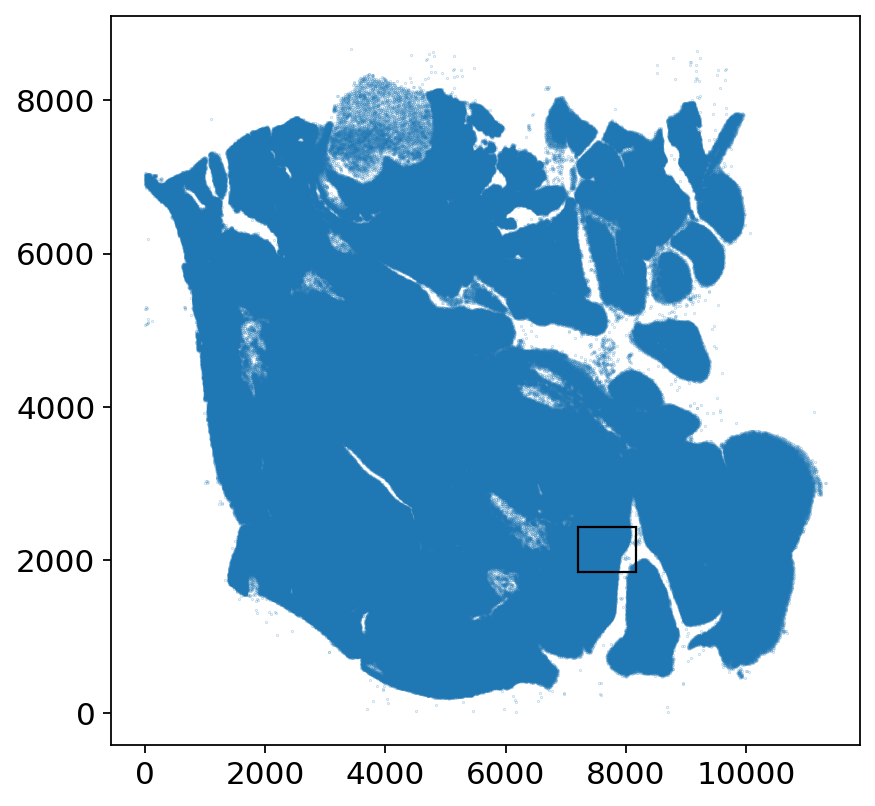

In [39]:
# zoom_x = 3000
# zoom_y = 1500

# zoom_x = 7400
# zoom_y = 1700

zoom_x = 7200
zoom_y = 1850

plt.figure(figsize=(6,6))
plt.scatter(
    *adata.obsm['spatial'].T,
    s=0.01,
)
rect = mpl.patches.Rectangle((zoom_x, zoom_y), zoom_width, zoom_height, edgecolor='k', fill=False)
plt.gca().add_patch(rect)
plt.grid(None)
plt.show()

In [40]:
zdata = adata[adata.obsm['spatial'][:,0]>zoom_x]
zdata = zdata[zdata.obsm['spatial'][:,0]<zoom_x+zoom_width]
zdata = zdata[zdata.obsm['spatial'][:,1]>zoom_y]
zdata = zdata[zdata.obsm['spatial'][:,1]<zoom_y+zoom_height]

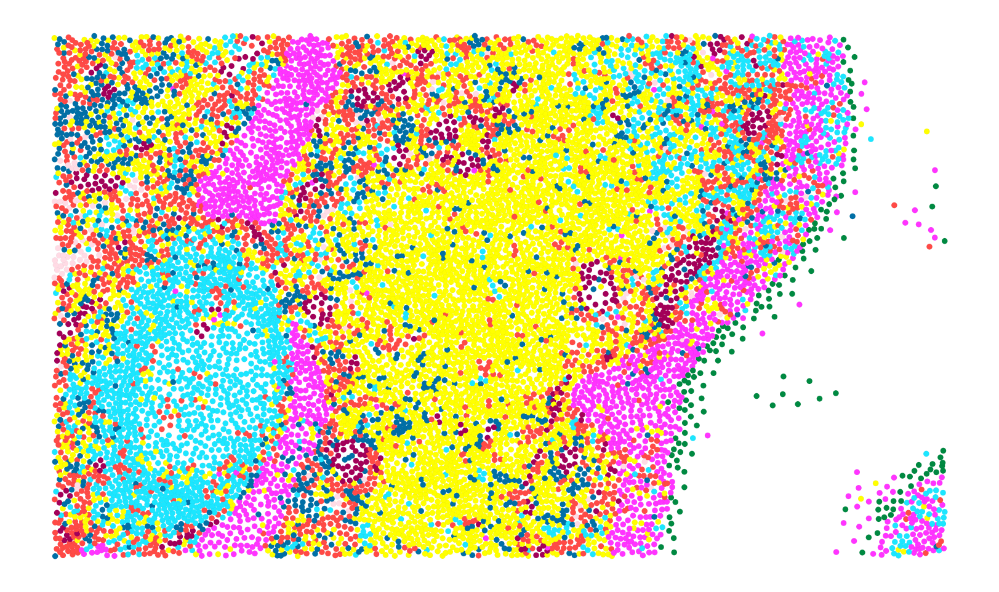

In [41]:
points = zdata.obsm['spatial']
plt.figure(figsize=(height*fignorm*(zoom_width/zoom_height), height*fignorm))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=18,
    c=zdata.obs['celltype_colors'],
)
plt.axis('off')
filename = os.path.join(figpath, f'celltypes_zoom1.png')
plt.savefig(filename, dpi=dpi)
plt.show()

# Zoom 2

In [42]:
# Set zoom dims
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
zoom_width = height/5
zoom_height = height/10

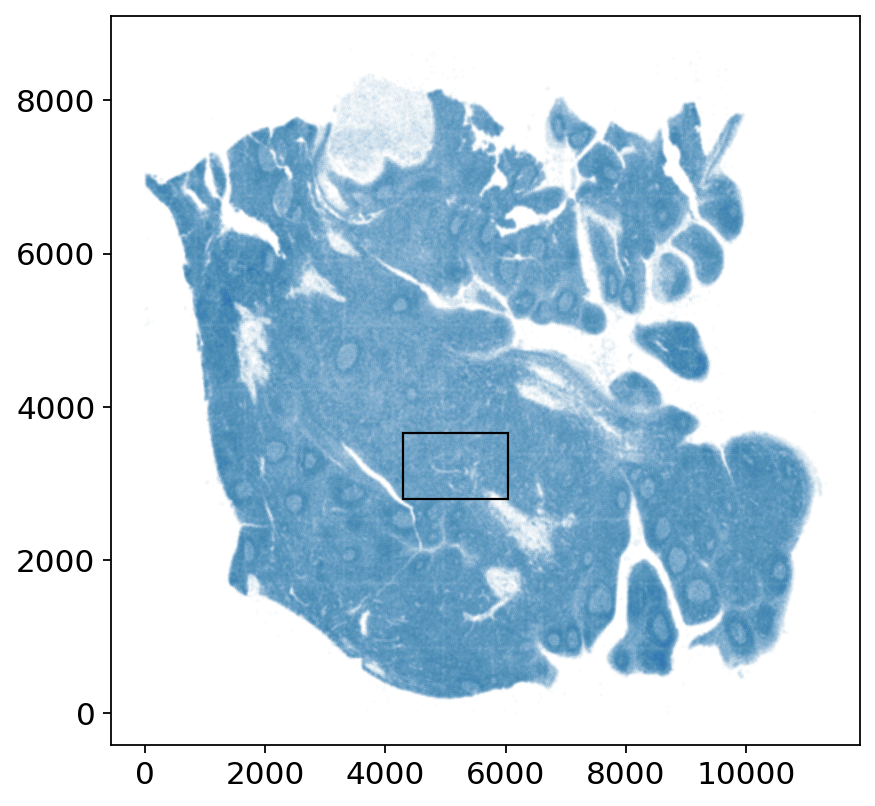

In [43]:
zoom_x = 4300
zoom_y = 2800

plt.figure(figsize=(6,6))
plt.scatter(*adata.obsm['spatial'].T, s=0.0001)
rect = mpl.patches.Rectangle((zoom_x, zoom_y), zoom_width, zoom_height, edgecolor='k', fill=False)
plt.gca().add_patch(rect)
plt.grid(None)
plt.show()

In [44]:
zdata = adata[adata.obsm['spatial'][:,0]>zoom_x]
zdata = zdata[zdata.obsm['spatial'][:,0]<zoom_x+zoom_width]
zdata = zdata[zdata.obsm['spatial'][:,1]>zoom_y]
zdata = zdata[zdata.obsm['spatial'][:,1]<zoom_y+zoom_height]

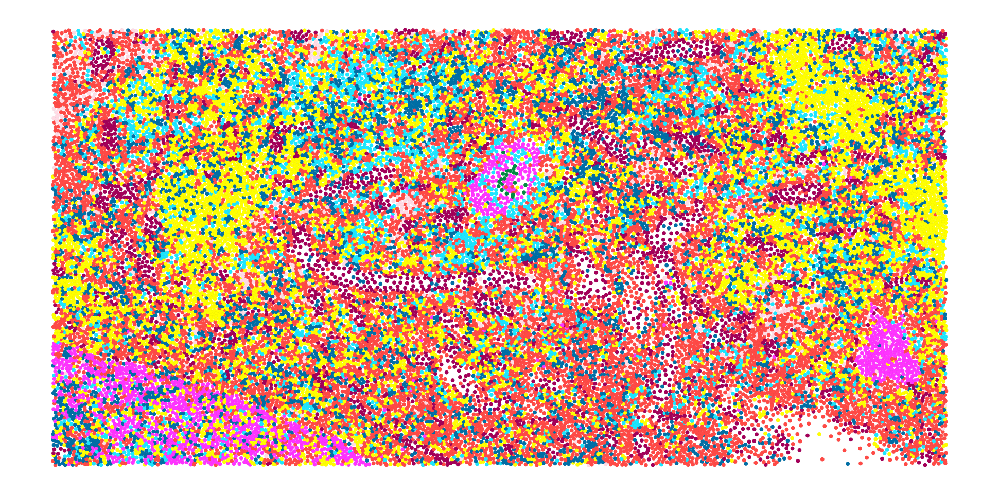

In [45]:
points = zdata.obsm['spatial']
plt.figure(figsize=(height*fignorm*(zoom_width/zoom_height), height*fignorm))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=12,
    c=zdata.obs['celltype_colors'],
)
plt.axis('off')
filename = os.path.join(figpath, f'celltypes_zoom2.png')
plt.savefig(filename, dpi=dpi)
plt.show()